# Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
import librosa
from librosa import display
from IPython import display as idp
%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings("ignore")
from glob import glob

In [2]:
audio_files = glob(r"D:\Audio_Classification_Project\Data\genres_original\*\*.wav")

In [3]:
len(audio_files)

999

In [4]:
audio_files[:5]

['D:\\Audio_Classification_Project\\Data\\genres_original\\blues\\blues.00000.wav',
 'D:\\Audio_Classification_Project\\Data\\genres_original\\blues\\blues.00001.wav',
 'D:\\Audio_Classification_Project\\Data\\genres_original\\blues\\blues.00002.wav',
 'D:\\Audio_Classification_Project\\Data\\genres_original\\blues\\blues.00003.wav',
 'D:\\Audio_Classification_Project\\Data\\genres_original\\blues\\blues.00004.wav']

# Listennig to audio using Ipython

In [5]:
idp.Audio(audio_files[110])

# Load and explore audio data

In [6]:
y,sr = librosa.load(audio_files[110],sr=None)
print(y[:5])
print(f'Shape: {y.shape}')
print(f'Sample Rate : {sr}')

[0.01327515 0.02868652 0.03347778 0.03164673 0.02670288]
Shape: (661794,)
Sample Rate : 22050


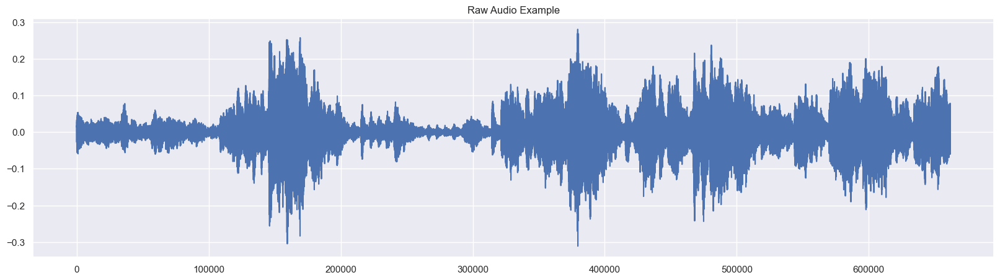

In [7]:
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw Audio Example')
plt.show()

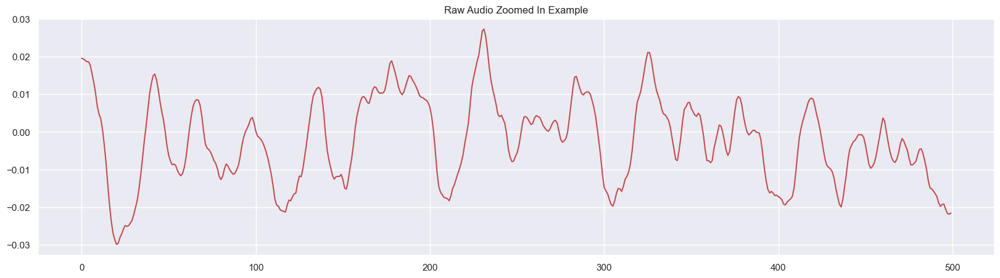

In [8]:
pd.Series(y[30000:30500]).plot(figsize=(20, 5),
                  title='Raw Audio Zoomed In Example',c='r')
plt.show()

In [9]:
D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
S_db.shape

(1025, 1293)

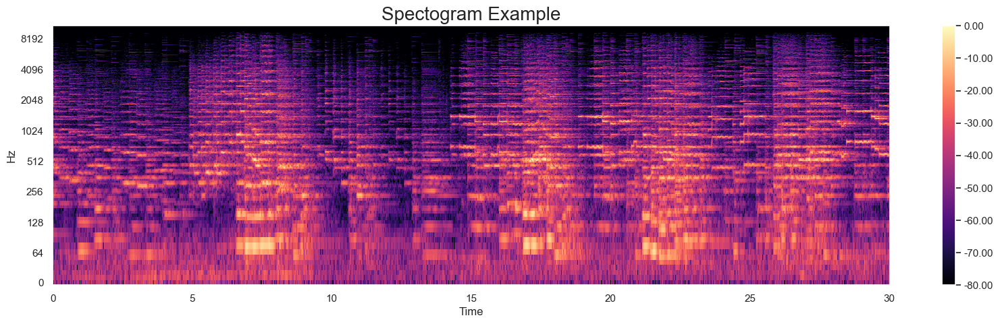

In [10]:
fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

In [11]:
S = librosa.feature.melspectrogram(y=y,sr=sr,n_mels=128 * 2,)
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

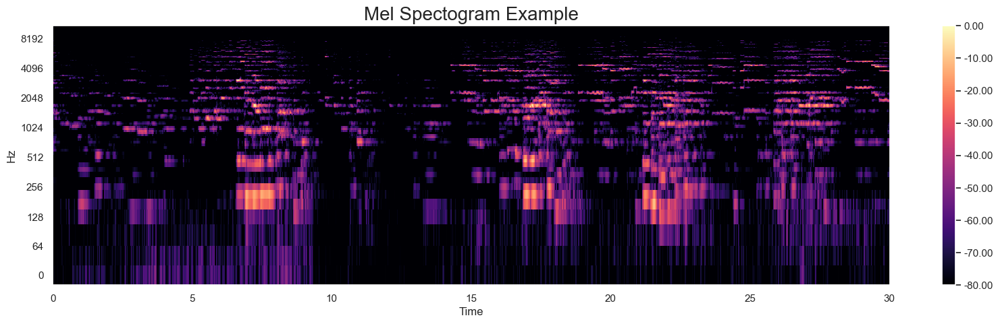

In [12]:
fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db_mel,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Mel Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

# Plot each genre to see differences

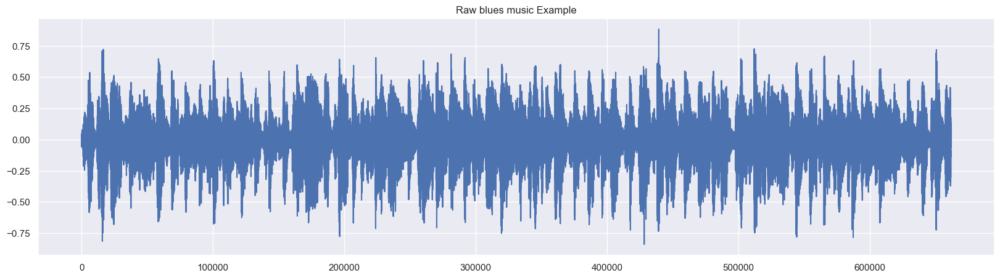

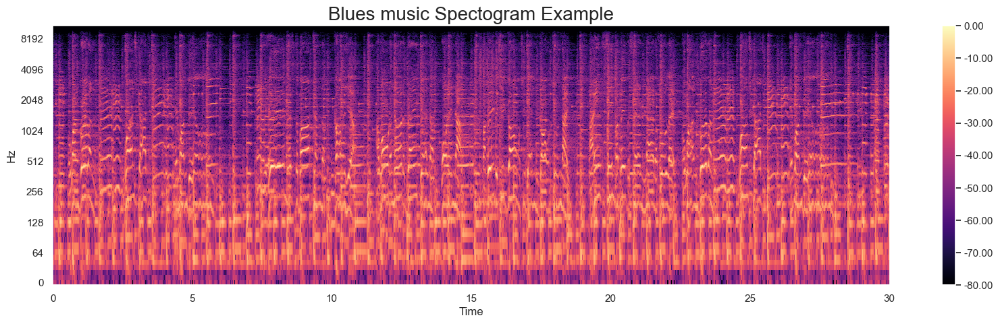

In [12]:
blues_music = r"D:\Audio_Classification_Project\Data\genres_original\blues\blues.00000.wav"
y,sr = librosa.load(blues_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw blues music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Blues music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

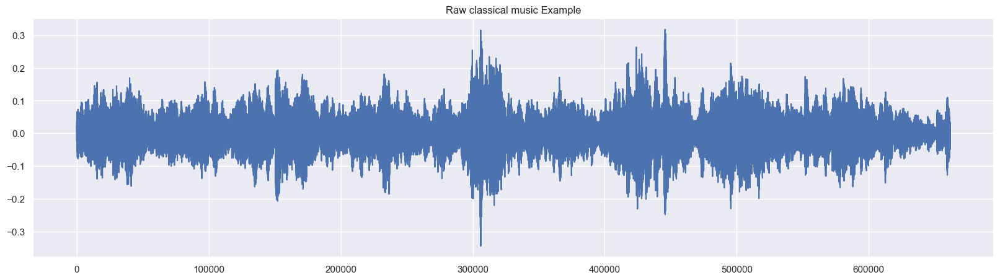

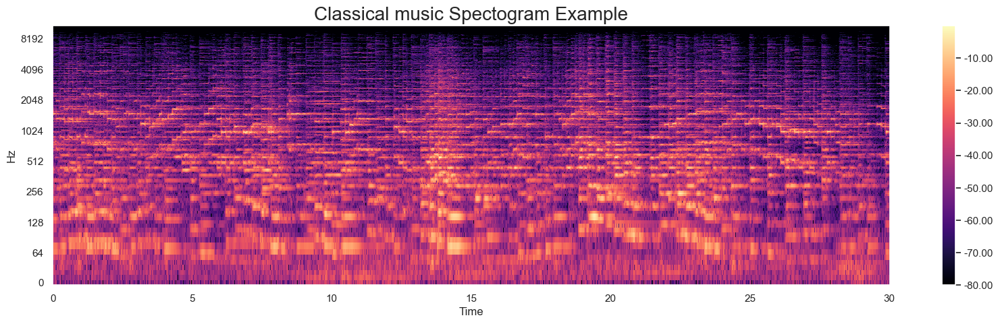

In [13]:
classical_music = r"D:\Audio_Classification_Project\Data\genres_original\classical\classical.00000.wav"
y,sr = librosa.load(classical_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw classical music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Classical music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

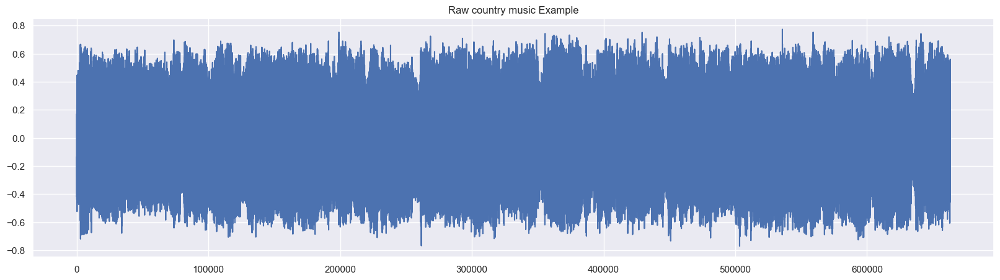

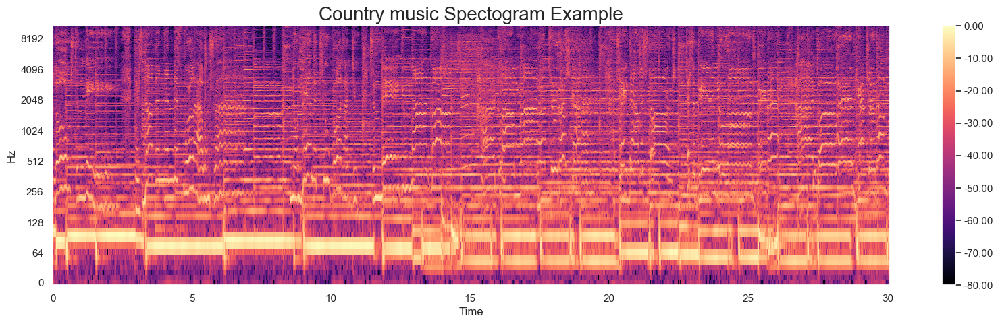

In [14]:
country_music = r"D:\Audio_Classification_Project\Data\genres_original\country\country.00000.wav"
y,sr = librosa.load(country_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw country music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Country music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

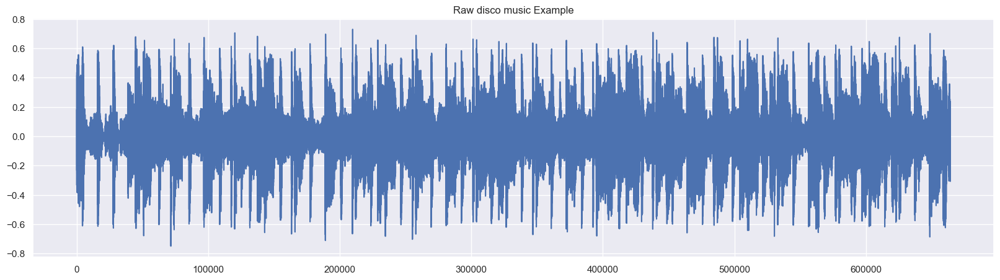

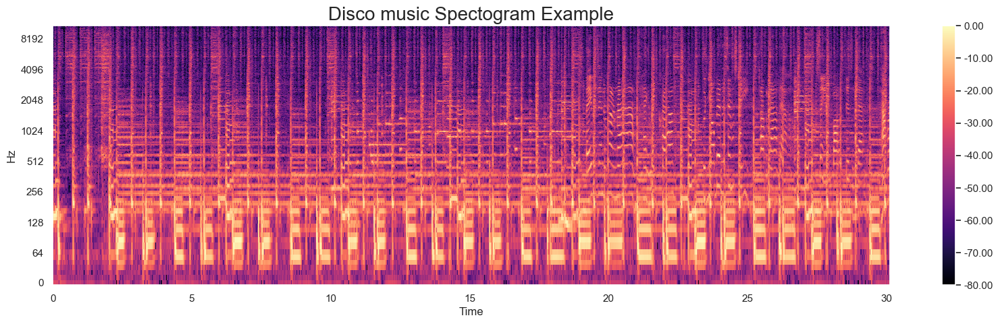

In [15]:
disco_music = r"D:\Audio_Classification_Project\Data\genres_original\disco\disco.00000.wav"
y,sr = librosa.load(disco_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw disco music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Disco music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

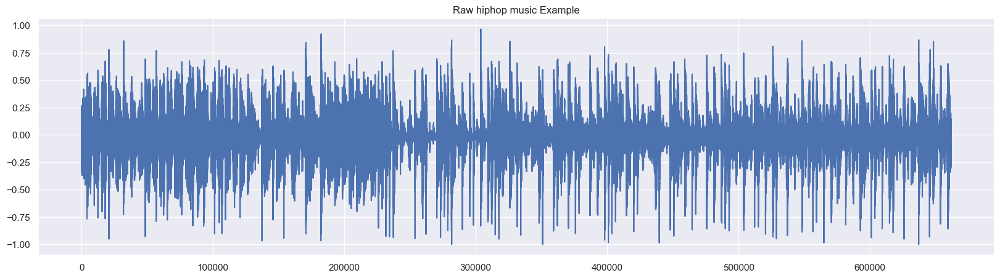

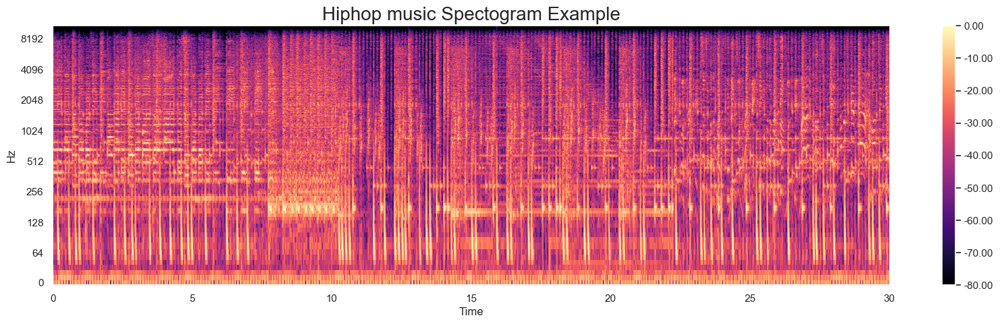

In [16]:
hiphop_music = r"D:\Audio_Classification_Project\Data\genres_original\hiphop\hiphop.00000.wav"
y,sr = librosa.load(hiphop_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw hiphop music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Hiphop music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

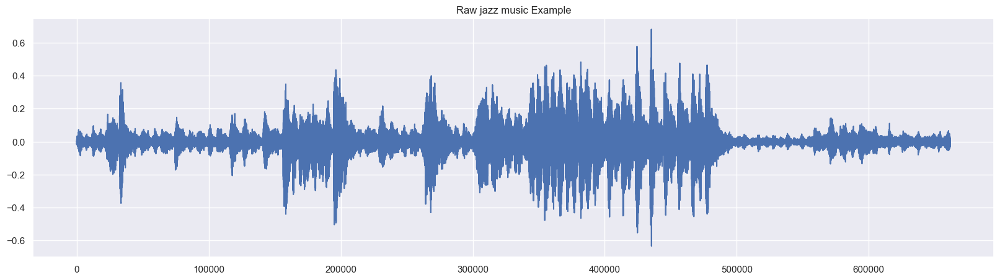

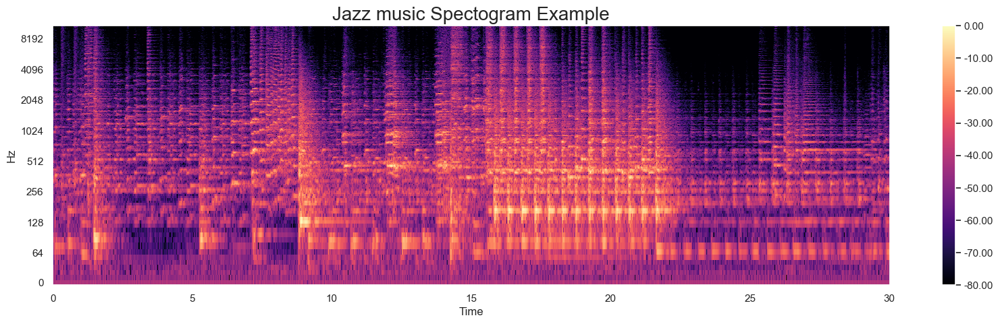

In [21]:
jazz_music = r"D:\Audio_Classification_Project\Data\genres_original\jazz\jazz.00000.wav"
y,sr = librosa.load(jazz_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw jazz music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Jazz music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

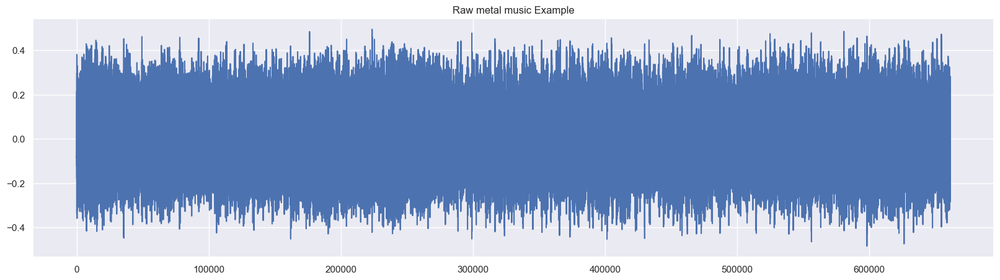

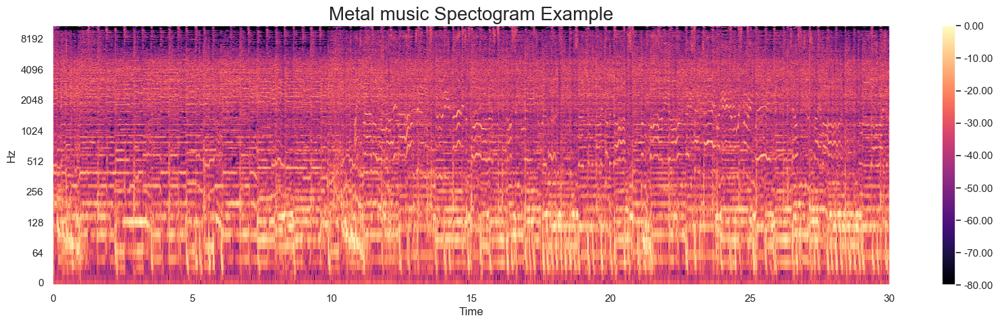

In [22]:
metal_music = r"D:\Audio_Classification_Project\Data\genres_original\metal\metal.00000.wav"
y,sr = librosa.load(metal_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw metal music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Metal music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

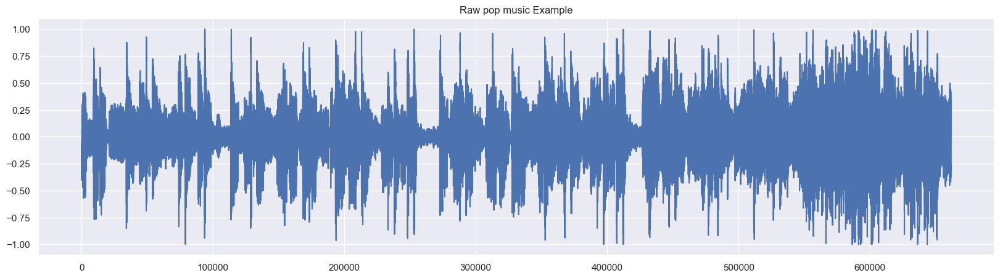

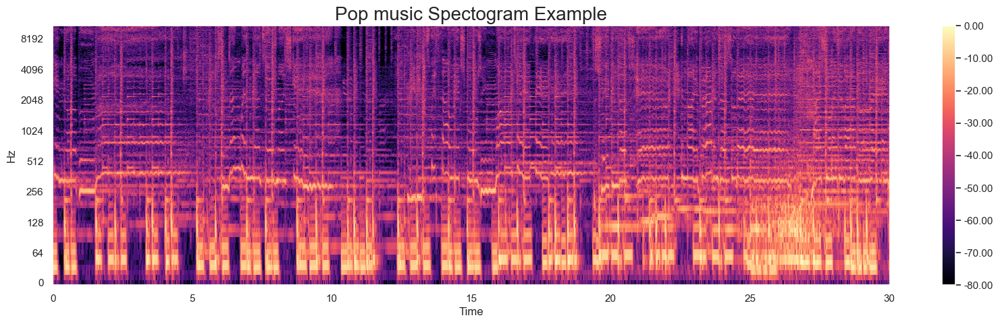

In [23]:
pop_music = r"D:\Audio_Classification_Project\Data\genres_original\pop\pop.00000.wav"
y,sr = librosa.load(pop_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw pop music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Pop music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

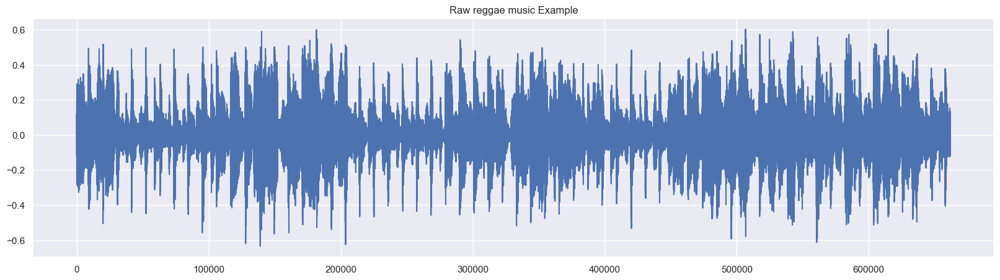

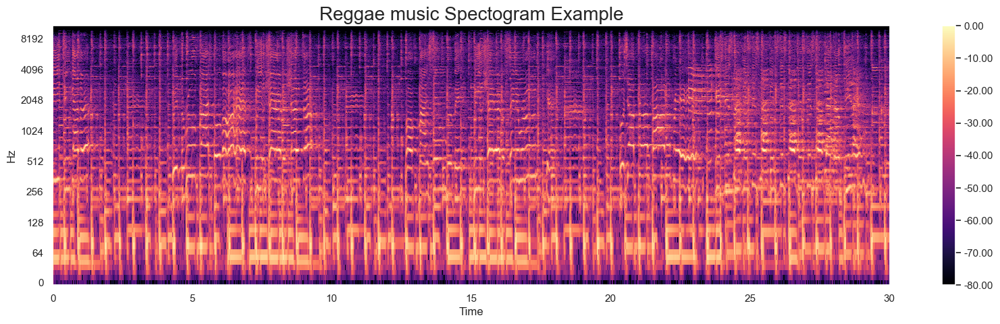

In [24]:
reggae_music = r"D:\Audio_Classification_Project\Data\genres_original\reggae\reggae.00000.wav"
y,sr = librosa.load(reggae_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw reggae music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Reggae music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

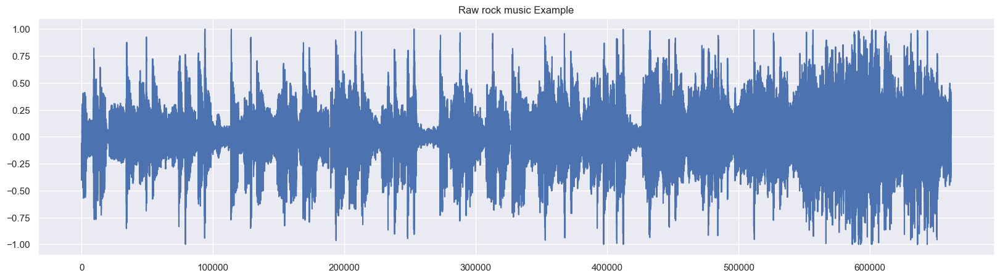

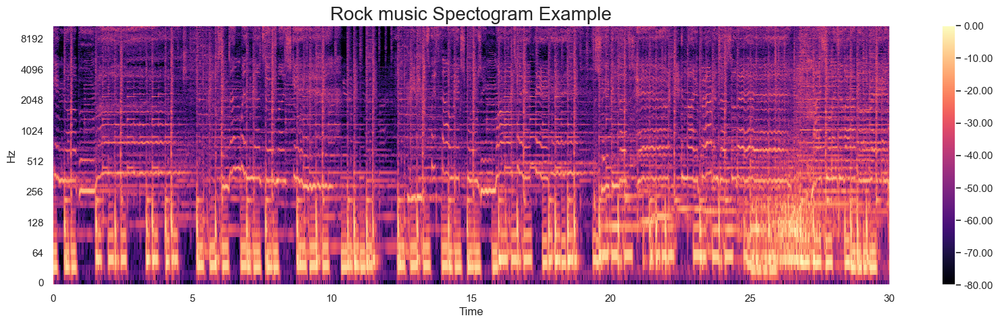

In [25]:
rock_music = r"D:\Audio_Classification_Project\Data\genres_original\rock\rock.00000.wav"
y,sr = librosa.load(pop_music,sr=None)
pd.Series(y).plot(figsize=(20, 5),
                  title='Raw rock music Example')

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

fig, ax = plt.subplots(figsize=(20, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Rock music Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

# Extracting features from audio

In [13]:
def extract_features_from_chunks(file_path, sr=22050, chunk_duration=3):
    y, sr = librosa.load(file_path, sr=sr)  # resample to fixed rate
    samples_per_chunk = sr * chunk_duration
    total_chunks = len(y) // samples_per_chunk

    chunk_features = []

    for i in range(total_chunks):
        start = i * samples_per_chunk
        end = start + samples_per_chunk
        y_chunk = y[start:end]

        # --- MFCCs ---
        mfcc = librosa.feature.mfcc(y=y_chunk, sr=sr, n_mfcc=13)
        mfcc_mean = np.mean(mfcc, axis=1)
        mfcc_std = np.std(mfcc, axis=1)

        # --- Chroma ---
        chroma = librosa.feature.chroma_stft(y=y_chunk, sr=sr)
        chroma_mean = np.mean(chroma, axis=1)
        chroma_std = np.std(chroma, axis=1)

        # --- Spectral Contrast ---
        spec_contrast = librosa.feature.spectral_contrast(y=y_chunk, sr=sr)
        spec_contrast_mean = np.mean(spec_contrast, axis=1)
        spec_contrast_std = np.std(spec_contrast, axis=1)

        # --- Tempo ---
        tempo, _ = librosa.beat.beat_track(y=y_chunk, sr=sr)
        tempo = float(tempo)

        # Combine
        vector_features = np.hstack([
            mfcc_mean, mfcc_std,
            chroma_mean, chroma_std,
            spec_contrast_mean, spec_contrast_std,
            [tempo]
        ])

        chunk_features.append(vector_features)

    return chunk_features

In [14]:
import time 

In [17]:
genres = glob(r"C:\codes and data\data\genres_original\*")
features = []
labels = []

for Dir in genres:
    genre_name = Dir.split('\\')[-1]
    for file in glob(f'{Dir}\*.wav'):
        file_start = time.time()
        
        file_features = extract_features_from_chunks(file, sr=22050, chunk_duration=3)
        features.extend(file_features)
        labels.extend([genre_name] * len(file_features))
        
        file_end = time.time()
        print(f"{file} processed in {file_end - file_start:.2f} seconds")


X = np.array(features)
y = np.array(labels)

C:\codes and data\data\genres_original\blues\blues.00000.wav processed in 0.17 seconds
C:\codes and data\data\genres_original\blues\blues.00001.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00002.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00003.wav processed in 0.15 seconds
C:\codes and data\data\genres_original\blues\blues.00004.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00005.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00006.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00007.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00008.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00009.wav processed in 0.16 seconds
C:\codes and data\data\genres_original\blues\blues.00010.wav processed in 0.15 seconds
C:\codes and data\data\genres_original\blue

In [18]:
X.shape

(9981, 65)

In [19]:
y.shape

(9981,)

# Data preprocessing

In [20]:
from sklearn.preprocessing import StandardScaler , LabelEncoder
from sklearn.model_selection import train_test_split

In [21]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.2,random_state=42)

In [22]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Train simple ANN

In [27]:
model = keras.Sequential([
    keras.layers.Input(shape=(65,)),
    keras.layers.Dense(128,activation='relu'),
    keras.layers.Dropout(.2),
    keras.layers.Dense(64,activation='relu'),
    keras.layers.Dropout(.2),
    keras.layers.Dense(10,activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [28]:
model.fit(X_train,y_train,epochs=200)

Epoch 1/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - accuracy: 0.4729 - loss: 1.4920
Epoch 2/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - accuracy: 0.6249 - loss: 1.0772
Epoch 3/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - accuracy: 0.6790 - loss: 0.9177
Epoch 4/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - accuracy: 0.7104 - loss: 0.8323
Epoch 5/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - accuracy: 0.7357 - loss: 0.7785
Epoch 6/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - accuracy: 0.7492 - loss: 0.7169
Epoch 7/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - accuracy: 0.7722 - loss: 0.6741
Epoch 8/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - accuracy: 0.7846 - loss: 0.6387
Epoch 9/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - accuracy: 0.7900 - loss: 0.6111
Epoch 10/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.7965 - loss: 0.5824
Epoch 11/200
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - accuracy: 0.8110 - loss: 0.5395
Epoch 12/200
250/25

In [29]:
model.evaluate(X_test,y_test)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.9049 - loss: 0.4276


[0.42761266231536865, 0.9048572778701782]

In [30]:
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step


In [31]:
class_names = pd.Series(y).unique()
class_names

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype=object)

In [32]:
from sklearn.metrics import classification_report
report = classification_report(y_test,y_pred_classes)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.95      0.93       208
           1       0.94      0.98      0.96       204
           2       0.86      0.89      0.88       186
           3       0.89      0.84      0.86       195
           4       0.95      0.89      0.92       236
           5       0.91      0.90      0.91       189
           6       0.92      0.95      0.93       210
           7       0.89      0.93      0.91       197
           8       0.92      0.89      0.91       199
           9       0.82      0.81      0.82       173

    accuracy                           0.90      1997
   macro avg       0.90      0.90      0.90      1997
weighted avg       0.91      0.90      0.90      1997



In [33]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_classes)

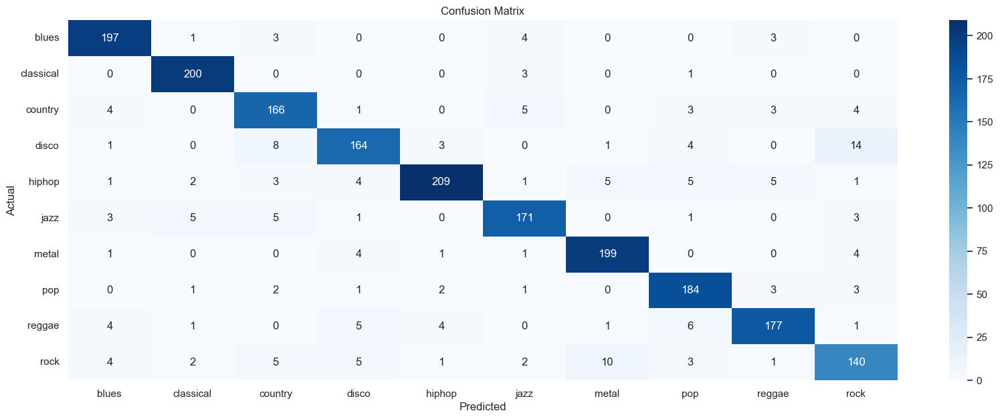

In [34]:
plt.figure(figsize=(20,7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [36]:
Map = {0:'Blues',1:'Classical',2:'Country',3:'Disco',4:'Hiphop',5:'Jazz',6:'Metal',7:'Pop',8:'Reggae',9:'Rock'}

In [42]:
tmp = extract_features_from_chunks(r"C:\Users\Asus - TUF\Downloads\late-night-big-band-swing-jazz-instrumental-236168.wav")
tmp_scaled = scaler.transform(tmp)   
preds = model.predict(np.array(tmp_scaled))   
preds_classes = np.argmax(preds, axis=1)    
final_class = np.bincount(preds_classes).argmax()
encoder.classes_[final_class]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


np.str_('jazz')

# Save model for deployment

In [43]:
# Save model
model.save("audio_genre_model.keras")   # or "audio_genre_model.keras"

# Load model later
# from tensorflow import keras
# model = keras.models.load_model("audio_genre_model.keras")
